In [1]:
import pandas as pd

## Movies_metadata

In [2]:
movies_metadata = pd.read_csv('movies_metadata.csv')
movies_metadata.head()

C:\Users\Pamela Sin\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [3]:
movies_metadata.id

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
45461    439050
45462    111109
45463     67758
45464    227506
45465    461257
Name: id, Length: 45466, dtype: object

In [4]:
movies_metadata.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count'],
      dtype='object')

### EDA START

In [153]:
movies_metadata2 = movies_metadata.copy()

In [164]:
movies_metadata2.isnull().sum()

adult                        0
belongs_to_collection    40945
budget                       0
genres                       0
homepage                 37659
id                           0
imdb_id                     17
original_language           11
original_title               0
overview                   954
popularity                   5
poster_path                386
production_companies         3
production_countries         3
release_date                87
revenue                      6
runtime                    263
spoken_languages             6
status                      87
tagline                  25035
title                        6
video                        6
vote_average                 6
vote_count                   6
dtype: int64

In [172]:
def column_summary(dataframe, column_name, show_plot):
    print(dataframe[column_name].describe())
    print('_' *90) 
    print("NaN:" ,dataframe[column_name].isnull().sum())
    print('_' *90) 
    print(pd.concat([dataframe[column_name].value_counts().to_frame(), dataframe[column_name].value_counts(normalize=True).to_frame()], axis=1))
    if show_plot == True:
        dataframe[column_name].value_counts().plot(kind='bar')

#### belongs_to_collection - Change to binary

In [169]:
column_summary(movies_metadata2, 'belongs_to_collection', False)

count                                                  4491
unique                                                 1698
top       {'id': 415931, 'name': 'The Bowery Boys', 'pos...
freq                                                     29
Name: belongs_to_collection, dtype: object
__________________________________________________________________________________________
NaN: 40945
__________________________________________________________________________________________
                                                    belongs_to_collection  \
{'id': 415931, 'name': 'The Bowery Boys', 'post...                     29   
{'id': 421566, 'name': 'Totò Collection', 'post...                     27   
{'id': 96887, 'name': 'Zatôichi: The Blind Swor...                     26   
{'id': 645, 'name': 'James Bond Collection', 'p...                     26   
{'id': 37261, 'name': 'The Carry On Collection'...                     25   
...                                                           

count     45436
unique        2
top           0
freq      40945
Name: belongs_to_collection, dtype: int64
__________________________________________________________________________________________
NaN: 0
__________________________________________________________________________________________
   belongs_to_collection  belongs_to_collection
0                  40945               0.901158
1                   4491               0.098842
__________________________________________________________________________________________


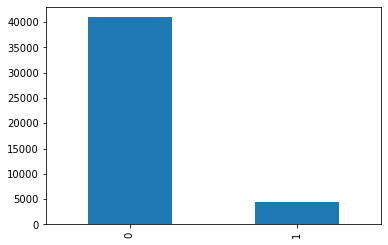

In [170]:
movies_metadata2.loc[~movies_metadata2['belongs_to_collection'].isnull(),'belongs_to_collection'] = 1  # not nan
movies_metadata2.loc[movies_metadata2['belongs_to_collection'].isnull(),'belongs_to_collection'] = 0   # nan
column_summary(movies_metadata2, 'belongs_to_collection', True)

#### budget - Convert 0 to NaN

In [173]:
column_summary(movies_metadata2, 'budget', False)

count     45436
unique     1226
top           0
freq      36553
Name: budget, dtype: object
__________________________________________________________________________________________
NaN: 0
__________________________________________________________________________________________
           budget    budget
0           36553  0.804494
5000000       286  0.006295
10000000      258  0.005678
20000000      243  0.005348
2000000       242  0.005326
...           ...       ...
4668069         1  0.000022
4620000         1  0.000022
4000            1  0.000022
380000000       1  0.000022
4490331         1  0.000022

[1226 rows x 2 columns]


In [174]:
movies_metadata2.budget = pd.to_numeric(movies_metadata2.budget, errors='coerce')

In [186]:
import numpy as np
movies_metadata2.loc[movies_metadata2['budget'] == 0,'budget'] = np.nan

In [199]:
column_summary(movies_metadata2, 'budget', False)

count    8.880000e+03
mean     2.161418e+07
std      3.432554e+07
min      1.000000e+00
25%      2.000000e+06
50%      8.000000e+06
75%      2.500000e+07
max      3.800000e+08
Name: budget, dtype: float64
__________________________________________________________________________________________
NaN: 36556
__________________________________________________________________________________________
            budget    budget
5000000.0      286  0.032207
10000000.0     258  0.029054
20000000.0     243  0.027365
2000000.0      242  0.027252
15000000.0     226  0.025450
...            ...       ...
4490331.0        1  0.000113
313411.0         1  0.000113
1020000.0        1  0.000113
37.0             1  0.000113
9500.0           1  0.000113

[1222 rows x 2 columns]


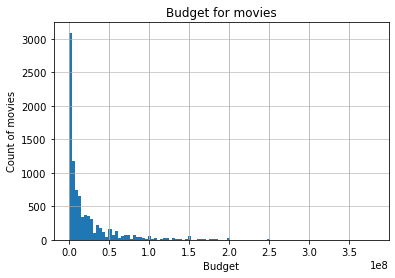

In [202]:
movies_metadata2.budget.plot.hist(grid=True, bins=100)
plt.title('Budget for movies')
plt.xlabel('Budget')
plt.ylabel('Count of movies')
plt.grid(axis='y', alpha=0.75)

#### genres

In [203]:
column_summary(movies_metadata2, 'genres', False)

count                             45436
unique                             4069
top       [{'id': 18, 'name': 'Drama'}]
freq                               4996
Name: genres, dtype: object
__________________________________________________________________________________________
NaN: 0
__________________________________________________________________________________________
                                                    genres    genres
[{'id': 18, 'name': 'Drama'}]                         4996  0.109957
[{'id': 35, 'name': 'Comedy'}]                        3620  0.079673
[{'id': 99, 'name': 'Documentary'}]                   2721  0.059886
[]                                                    2442  0.053746
[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'na...    1300  0.028612
...                                                    ...       ...
[{'id': 9648, 'name': 'Mystery'}, {'id': 10749,...       1  0.000022
[{'id': 28, 'name': 'Action'}, {'id': 10769, 'n...       1  0.000022
[{

#### original_language

In [216]:
pd.set_option("display.max_rows", None)
column_summary(movies_metadata2, 'original_language', False)

count     45425
unique       92
top          en
freq      32251
Name: original_language, dtype: object
__________________________________________________________________________________________
NaN: 11
__________________________________________________________________________________________
       original_language  original_language
en                 32251           0.709983
fr                  2436           0.053627
it                  1529           0.033660
ja                  1347           0.029653
de                  1079           0.023753
es                   994           0.021882
ru                   826           0.018184
hi                   508           0.011183
ko                   444           0.009774
zh                   409           0.009004
sv                   383           0.008431
pt                   316           0.006957
cn                   313           0.006890
fi                   295           0.006494
nl                   248           0.005460
da 

In [242]:
temp_series = movies_metadata2['original_language'].value_counts() < 200
temp_list = list(temp_series[temp_series].index)
temp_list

['tr',
 'cs',
 'el',
 'no',
 'hu',
 'fa',
 'ta',
 'th',
 'he',
 'sr',
 'ro',
 'te',
 'ar',
 'ml',
 'xx',
 'hr',
 'bn',
 'mr',
 'et',
 'is',
 'tl',
 'id',
 'lv',
 'ka',
 'sl',
 'uk',
 'bs',
 'ca',
 'bg',
 'ab',
 'vi',
 'sk',
 'lt',
 'ur',
 'nb',
 'sq',
 'sh',
 'ms',
 'wo',
 'mk',
 'ku',
 'kn',
 'eu',
 'ky',
 'kk',
 'bm',
 'lo',
 'ps',
 'am',
 'mn',
 'ne',
 'af',
 'bo',
 'pa',
 'iu',
 'fy',
 'cy',
 '68.0',
 'qu',
 'ay',
 'gl',
 'mt',
 'tg',
 '104.0',
 'uz',
 'rw',
 'la',
 'jv',
 'zu',
 'hy',
 'si',
 'sm',
 'lb',
 'eo',
 '82.0']

count     45425
unique       18
top          en
freq      32251
Name: original_language, dtype: object
__________________________________________________________________________________________
NaN: 11
__________________________________________________________________________________________
            original_language  original_language
en                      32251           0.709983
fr                       2436           0.053627
infrequent               1604           0.035311
it                       1529           0.033660
ja                       1347           0.029653
de                       1079           0.023753
es                        994           0.021882
ru                        826           0.018184
hi                        508           0.011183
ko                        444           0.009774
zh                        409           0.009004
sv                        383           0.008431
pt                        316           0.006957
cn                   

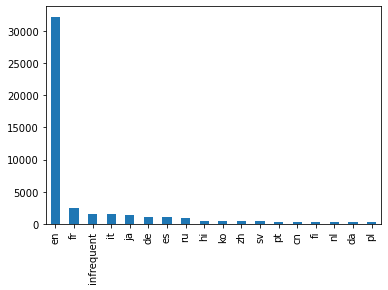

In [244]:
movies_metadata2.loc[movies_metadata2['original_language'].isin(temp_list) ,'original_language'] = 'infrequent'
column_summary(movies_metadata2, 'original_language', True)

In [204]:
movies_metadata.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count'],
      dtype='object')

#### adult, homepage, poster_path, status, video, spoken_languages - Not useful

count     45436
unique        5
top       False
freq      45424
Name: adult, dtype: object
__________________________________________________________________________________________
NaN: 0
__________________________________________________________________________________________
                                                    adult     adult
False                                               45424  0.999736
True                                                    9  0.000198
 Avalanche Sharks tells the story of a bikini c...      1  0.000022
 - Written by Ørnås                                     1  0.000022
 Rune Balot goes to a casino connected to the O...      1  0.000022


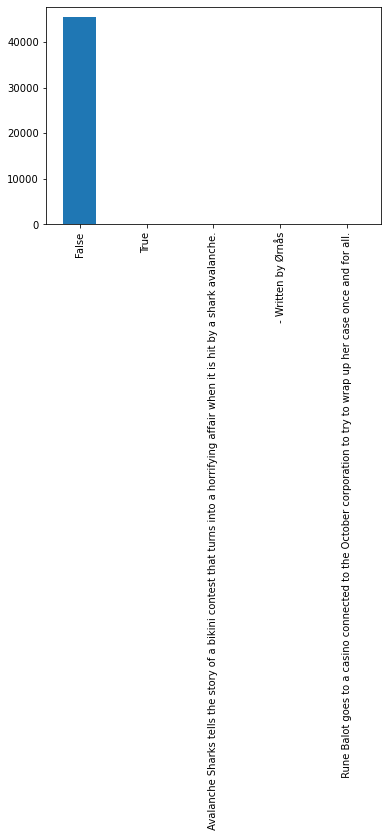

In [271]:
column_summary(movies_metadata2, 'adult', True)

In [245]:
column_summary(movies_metadata2, 'homepage', False)

count                            7777
unique                           7673
top       http://www.georgecarlin.com
freq                               12
Name: homepage, dtype: object
__________________________________________________________________________________________
NaN: 37659
__________________________________________________________________________________________
                                                    homepage  homepage
http://www.georgecarlin.com                               12  0.001543
http://www.wernerherzog.com/films-by.html                  7  0.000900
http://breakblade.jp/                                      6  0.000772
http://www.crownintlpictures.com/tztitles.html             4  0.000514
http://www.missionimpossible.com/                          4  0.000514
http://www.crownintlpictures.com/actitles.html             4  0.000514
http://www.kungfupanda.com/                                4  0.000514
http://www.crownintlpictures.com/ostitles.html           

In [246]:
column_summary(movies_metadata2, 'poster_path', False)

count                                45050
unique                               45024
top       /5D7UBSEgdyONE6Lql6xS7s6OLcW.jpg
freq                                     5
Name: poster_path, dtype: object
__________________________________________________________________________________________
NaN: 386
__________________________________________________________________________________________
                                     poster_path  poster_path
/5D7UBSEgdyONE6Lql6xS7s6OLcW.jpg               5     0.000111
/qW1oQlOHizRHXZQrpkimYr0oxzn.jpg               4     0.000089
/2kslZXOaW0HmnGuVPCnQlCdXFR9.jpg               4     0.000089
/cdwVC18URfEdQjjxqJyRMoGDC0H.jpg               3     0.000067
/xPAupWOWNT4oze9ACP0KW0mCLyB.jpg               2     0.000044
/5LiahdmMdeMrB2YP1HuU3O7Qt3b.jpg               2     0.000044
/9J2WtOYjql5AKvcWOiP8TJPxqx8.jpg               2     0.000044
/s76FbZck4akTb3GuQAuvoRPvSwV.jpg               2     0.000044
/wi8sxMp2kDVnleYl3o71NIDPh7q.jpg              

In [247]:
column_summary(movies_metadata2, 'status', False)

count        45349
unique           6
top       Released
freq         44985
Name: status, dtype: object
__________________________________________________________________________________________
NaN: 87
__________________________________________________________________________________________
                 status    status
Released          44985  0.991973
Rumored             229  0.005050
Post Production      98  0.002161
In Production        20  0.000441
Planned              15  0.000331
Canceled              2  0.000044


In [248]:
column_summary(movies_metadata2, 'video', False)

count     45430
unique        2
top       False
freq      45337
Name: video, dtype: object
__________________________________________________________________________________________
NaN: 6
__________________________________________________________________________________________
       video     video
False  45337  0.997953
True      93  0.002047


In [273]:
column_summary(movies_metadata2, 'spoken_languages', False)

count                                        45430
unique                                        1931
top       [{'iso_639_1': 'en', 'name': 'English'}]
freq                                         22381
Name: spoken_languages, dtype: object
__________________________________________________________________________________________
NaN: 6
__________________________________________________________________________________________
                                                    spoken_languages  \
[{'iso_639_1': 'en', 'name': 'English'}]                       22381   
[]                                                              3827   
[{'iso_639_1': 'fr', 'name': 'Français'}]                       1851   
[{'iso_639_1': 'ja', 'name': '日本語'}]                            1287   
[{'iso_639_1': 'it', 'name': 'Italiano'}]                       1218   
[{'iso_639_1': 'es', 'name': 'Español'}]                         902   
[{'iso_639_1': 'ru', 'name': 'Pусский'}]                         

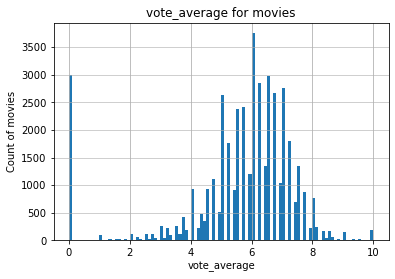

In [255]:
movies_metadata2.vote_average.plot.hist(grid=True, bins=100)
plt.title('vote_average for movies')
plt.xlabel('vote_average')
plt.ylabel('Count of movies')
plt.grid(axis='y', alpha=0.75)

In [258]:
column_summary(movies_metadata2, 'vote_count', False)

count    45430.000000
mean       109.935989
std        491.466335
min          0.000000
25%          3.000000
50%         10.000000
75%         34.000000
max      14075.000000
Name: vote_count, dtype: float64
__________________________________________________________________________________________
NaN: 6
__________________________________________________________________________________________
         vote_count  vote_count
1.0            3262    0.071803
2.0            3132    0.068941
0.0            2896    0.063746
3.0            2782    0.061237
4.0            2479    0.054567
5.0            2096    0.046137
6.0            1747    0.038455
7.0            1568    0.034515
8.0            1359    0.029914
9.0            1194    0.026282
10.0           1171    0.025776
11.0            944    0.020779
12.0            859    0.018908
13.0            733    0.016135
14.0            700    0.015408
15.0            673    0.014814
16.0            601    0.013229
17.0            554    0.0

(0.0, 300.0)

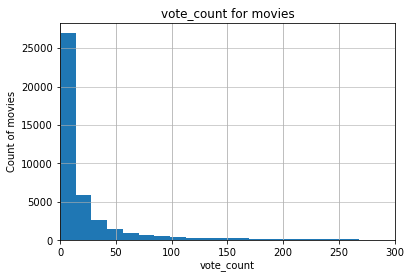

In [270]:
movies_metadata2.vote_count.plot.hist(grid=True, bins=1000)
plt.title('vote_count for movies')
plt.xlabel('vote_count')
plt.ylabel('Count of movies')
plt.grid(axis='y', alpha=0.75)
plt.xlim(xmin=0, xmax = 300)

### EDA END

In [5]:
movies_metadata.loc[movies_metadata.id.duplicated(),:]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
1465,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,1995-02-16,0.0,115.0,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.0,1.0
9165,False,NaN,0,"[{'id': 80, 'name': 'Crime'}, {'id': 18, 'name...",NaN,5511,tt0062229,fr,Le Samouraï,Hitman Jef Costello is a perfectionist who alw...,...,1967-10-25,39481.0,105.0,"[{'iso_639_1': 'fr', 'name': 'Français'}]",Released,There is no solitude greater than that of the ...,Le Samouraï,False,7.9,187.0
9327,False,NaN,0,"[{'id': 12, 'name': 'Adventure'}, {'id': 16, '...",NaN,23305,tt0295682,en,The Warrior,"In feudal India, a warrior (Khan) who renounce...",...,2001-09-23,0.0,86.0,"[{'iso_639_1': 'hi', 'name': 'हिन्दी'}]",Released,NaN,The Warrior,False,6.3,15.0
12066,False,NaN,1600000,"[{'id': 18, 'name': 'Drama'}, {'id': 80, 'name...",http://www.bubblethefilm.com/,14788,tt0454792,en,Bubble,Set against the backdrop of a decaying Midwest...,...,2005-09-03,0.0,73.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Bubble,False,6.4,36.0
13375,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}, {'id': 9648, ...",NaN,141971,tt1180333,fi,Blackout,Recovering from a nail gun shot to the head an...,...,2008-12-26,0.0,108.0,"[{'iso_639_1': 'fi', 'name': 'suomi'}]",Released,Which one is the first to return - memory or t...,Blackout,False,6.7,3.0
15074,False,NaN,4,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,22649,tt0022879,en,A Farewell to Arms,British nurse Catherine Barkley (Helen Hayes) ...,...,1932-12-08,25.0,89.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Every woman who has loved will understand,A Farewell to Arms,False,6.2,29.0
15765,False,NaN,2500,"[{'id': 18, 'name': 'Drama'}, {'id': 35, 'name...",NaN,13209,tt0499537,fa,Offside,"Since women are banned from soccer matches, Ir...",...,2006-05-26,0.0,93.0,"[{'iso_639_1': 'fa', 'name': 'فارسی'}]",Released,NaN,Offside,False,6.7,27.0
16764,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}, {'id': 9648, ...",NaN,141971,tt1180333,fi,Blackout,Recovering from a nail gun shot to the head an...,...,2008-12-26,0.0,108.0,"[{'iso_639_1': 'fi', 'name': 'suomi'}]",Released,Which one is the first to return - memory or t...,Blackout,False,6.7,3.0
20843,False,NaN,40000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 18, '...",NaN,77221,tt1701210,en,Black Gold,"On the Arabian Peninsula in the 1930s, two war...",...,2011-12-21,5446000.0,130.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Black Gold,False,5.9,77.0
20899,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,109962,tt0082992,en,Rich and Famous,Two literary women compete for 20 years: one w...,...,1981-09-23,0.0,115.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,"From the very beginning, they knew they'd be f...",Rich and Famous,False,4.9,7.0


In [6]:
movies_metadata.loc[movies_metadata.id == '105045' ,:]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
676,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,1995-02-16,0.0,115.0,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.0,1.0
1465,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,1995-02-16,0.0,115.0,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.0,1.0


In [7]:
movies_metadata.drop_duplicates(subset=['id'], inplace = True)
movies_metadata.shape

(45436, 24)

## Links data

In [8]:
links = pd.read_csv('links.csv')
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [9]:
links.shape

(45843, 3)

In [10]:
links.tmdbId

0           862.0
1          8844.0
2         15602.0
3         31357.0
4         11862.0
           ...   
45838    439050.0
45839    111109.0
45840     67758.0
45841    227506.0
45842    461257.0
Name: tmdbId, Length: 45843, dtype: float64

In [11]:
links.loc[links.tmdbId.duplicated(keep=False),:]

,movieId,imdbId,tmdbId
140,142,94878,NaN
598,604,115978,NaN
678,690,111613,105045.0
708,720,118114,NaN
709,721,114103,NaN
...,...,...,...
40391,162632,2818654,298721.0
40629,163246,127834,97995.0
45197,174533,235679,10991.0
45202,174543,287635,12600.0


In [12]:
links.loc[links.tmdbId == 265189.0 ,:]

,movieId,imdbId,tmdbId
24448,114342,3630276,265189.0
45641,175813,2121382,265189.0


In [13]:
links.loc[links.tmdbId == 12600.0 ,:]

,movieId,imdbId,tmdbId
5574,5672,313487,12600.0
45202,174543,287635,12600.0


In [14]:
movies_metadata.loc[movies_metadata.id == '265189',:]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
24164,False,NaN,0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,265189,tt2121382,sv,Turist,"While holidaying in the French Alps, a Swedish...",...,2014-08-15,1359497.0,118.0,"[{'iso_639_1': 'fr', 'name': 'Français'}, {'is...",Released,NaN,Force Majeure,False,6.8,255.0


In [15]:
movies_metadata.loc[movies_metadata.id == '12600' ,:]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
5535,False,"{'id': 34055, 'name': 'Pokémon Collection', 'p...",0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",http://www.pokemon.com/us/movies/movie-pokemon...,12600,tt0287635,ja,劇場版ポケットモンスター セレビィ 時を越えた遭遇（であい）,"All your favorite Pokémon characters are back,...",...,2001-07-06,28023563.0,75.0,"[{'iso_639_1': 'ja', 'name': '日本語'}]",Released,NaN,Pokémon 4Ever: Celebi - Voice of the Forest,False,5.7,82.0


In [16]:
links.drop_duplicates(subset = ['tmdbId'], keep = False, inplace = True)
links.shape

(45565, 3)

In [17]:
links.tmdbId = links.tmdbId.astype(float)
links.tmdbId = links.tmdbId.astype(int)
links.tmdbId = links.tmdbId.astype(str)
links.tmdbId 

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
45838    439050
45839    111109
45840     67758
45841    227506
45842    461257
Name: tmdbId, Length: 45565, dtype: object

In [18]:
movies_metadata.id = movies_metadata.id.astype(str)
movies_metadata.id

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
45461    439050
45462    111109
45463     67758
45464    227506
45465    461257
Name: id, Length: 45436, dtype: object

In [19]:
#This merge only includes rows with the same key in both datasets
moviesmetadata_links = pd.merge(movies_metadata, links, left_on='id', right_on='tmdbId')
moviesmetadata_links

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,movieId,imdbId,tmdbId
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0,1,114709,862
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,2,113497,8844
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,3,113228,15602
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,4,114885,31357
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,5,113041,11862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45399,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,...,"[{'iso_639_1': 'fa', 'name': 'فارسی'}]",Released,Rising and falling between a man and woman,Subdue,False,4.0,1.0,176269,6209470,439050
45400,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,...,"[{'iso_639_1': 'tl', 'name': ''}]",Released,NaN,Century of Birthing,False,9.0,3.0,176271,2028550,111109
45401,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,A deadly game of wits.,Betrayal,False,3.8,6.0,176273,303758,67758
45402,False,NaN,0,[],NaN,227506,tt0008536,en,Satana likuyushchiy,"In a small town live two brothers, one a minis...",...,[],Released,NaN,Satan Triumphant,False,0.0,0.0,176275,8536,227506


## Keywords data

In [20]:
keywords = pd.read_csv('keywords.csv')
keywords.head()

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In [21]:
keywords.id = keywords.id.astype(int)
keywords.id = keywords.id.astype(str)
keywords.id

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
46414    439050
46415    111109
46416     67758
46417    227506
46418    461257
Name: id, Length: 46419, dtype: object

In [22]:
keywords.loc[keywords.id.duplicated(keep=False),:]

,id,keywords
676,105045,"[{'id': 7059, 'name': 'anti-communism'}, {'id'..."
838,132641,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
949,22649,"[{'id': 131, 'name': 'italy'}, {'id': 428, 'na..."
1465,105045,"[{'id': 7059, 'name': 'anti-communism'}, {'id'..."
2564,84198,"[{'id': 187056, 'name': 'woman director'}]"
...,...,...
40994,298721,"[{'id': 1227, 'name': 'cemetery'}, {'id': 1261..."
41230,97995,[]
45774,10991,"[{'id': 1262, 'name': 'mountain'}, {'id': 2802..."
45779,12600,"[{'id': 9663, 'name': 'sequel'}, {'id': 11451,..."


In [23]:
keywords.loc[keywords.id == '105045',:]

,id,keywords
676,105045,"[{'id': 7059, 'name': 'anti-communism'}, {'id'..."
1465,105045,"[{'id': 7059, 'name': 'anti-communism'}, {'id'..."


In [24]:
keywords.loc[keywords.id == '132641',:]

,id,keywords
838,132641,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
29999,132641,"[{'id': 818, 'name': 'based on novel'}, {'id':..."


In [25]:
keywords.drop_duplicates(subset = ['id'], keep = 'first', inplace = True)
keywords.shape

(45432, 2)

In [26]:
moviesmetadata_links_keywords = pd.merge(moviesmetadata_links, keywords, left_on='id', right_on='id')
moviesmetadata_links_keywords

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,status,tagline,title,video,vote_average,vote_count,movieId,imdbId,tmdbId,keywords
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Released,NaN,Toy Story,False,7.7,5415.0,1,114709,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,2,113497,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,3,113228,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,4,114885,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,5,113041,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45398,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,...,Released,Rising and falling between a man and woman,Subdue,False,4.0,1.0,176269,6209470,439050,"[{'id': 10703, 'name': 'tragic love'}]"
45399,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,...,Released,NaN,Century of Birthing,False,9.0,3.0,176271,2028550,111109,"[{'id': 2679, 'name': 'artist'}, {'id': 14531,..."
45400,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",...,Released,A deadly game of wits.,Betrayal,False,3.8,6.0,176273,303758,67758,[]
45401,False,NaN,0,[],NaN,227506,tt0008536,en,Satana likuyushchiy,"In a small town live two brothers, one a minis...",...,Released,NaN,Satan Triumphant,False,0.0,0.0,176275,8536,227506,[]


## Credits data

In [27]:
credits= pd.read_csv('credits.csv')
credits.head()

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [28]:
credits.id = credits.id.astype(int)
credits.id = credits.id.astype(str)
credits.id

0           862
1          8844
2         15602
3         31357
4         11862
          ...  
45471    439050
45472    111109
45473     67758
45474    227506
45475    461257
Name: id, Length: 45476, dtype: object

In [29]:
credits.loc[credits.id.duplicated(keep=False),:]

,cast,crew,id
676,"[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de...",105045
838,"[{'cast_id': 4, 'character': 'Mihoko Nakagawa'...","[{'credit_id': '52fe4b9ac3a368484e190d25', 'de...",132641
949,"[{'cast_id': 1, 'character': 'Catherine Barkle...","[{'credit_id': '56d73d3e9251414291002436', 'de...",22649
1465,"[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de...",105045
2564,"[{'cast_id': 3, 'character': 'Himself', 'credi...","[{'credit_id': '52fe48e09251416c9109b347', 'de...",84198
...,...,...,...
40051,"[{'cast_id': 1, 'character': 'Jenjira', 'credi...","[{'credit_id': '5739ceeac3a3683c9d000c12', 'de...",298721
40287,"[{'cast_id': 1001, 'character': 'Max.', 'credi...","[{'credit_id': '55140dfa92514103e9002d99', 'de...",97995
44831,"[{'cast_id': 1, 'character': 'Ash Ketchum', 'c...","[{'credit_id': '52fe43de9251416c750213ff', 'de...",10991
44836,"[{'cast_id': 1, 'character': 'Ash Ketchum (voi...","[{'credit_id': '52fe45049251416c75048e35', 'de...",12600


In [30]:
credits.loc[credits.id == '105045',:]

,cast,crew,id
676,"[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de...",105045
1465,"[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de...",105045


In [31]:
credits.loc[credits.id == '132641',:]

,cast,crew,id
838,"[{'cast_id': 4, 'character': 'Mihoko Nakagawa'...","[{'credit_id': '52fe4b9ac3a368484e190d25', 'de...",132641
30013,"[{'cast_id': 4, 'character': 'Mihoko Nakagawa'...","[{'credit_id': '56365ed9925141285701b06e', 'de...",132641


In [32]:
credits.drop_duplicates(subset = ['id'], keep = 'first', inplace = True)
credits.shape

(45432, 3)

In [33]:
moviesmetadata_links_keywords_credits = pd.merge(moviesmetadata_links_keywords, credits, left_on='id', right_on='id')
moviesmetadata_links_keywords_credits

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,title,video,vote_average,vote_count,movieId,imdbId,tmdbId,keywords,cast,crew
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Toy Story,False,7.7,5415.0,1,114709,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Jumanji,False,6.9,2413.0,2,113497,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Grumpier Old Men,False,6.5,92.0,3,113228,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Waiting to Exhale,False,6.1,34.0,4,114885,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Father of the Bride Part II,False,5.7,173.0,5,113041,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45398,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,...,Subdue,False,4.0,1.0,176269,6209470,439050,"[{'id': 10703, 'name': 'tragic love'}]","[{'cast_id': 0, 'character': '', 'credit_id': ...","[{'credit_id': '5894a97d925141426c00818c', 'de..."
45399,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,...,Century of Birthing,False,9.0,3.0,176271,2028550,111109,"[{'id': 2679, 'name': 'artist'}, {'id': 14531,...","[{'cast_id': 1002, 'character': 'Sister Angela...","[{'credit_id': '52fe4af1c3a36847f81e9b15', 'de..."
45400,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",...,Betrayal,False,3.8,6.0,176273,303758,67758,[],"[{'cast_id': 6, 'character': 'Emily Shaw', 'cr...","[{'credit_id': '52fe4776c3a368484e0c8387', 'de..."
45401,False,NaN,0,[],NaN,227506,tt0008536,en,Satana likuyushchiy,"In a small town live two brothers, one a minis...",...,Satan Triumphant,False,0.0,0.0,176275,8536,227506,[],"[{'cast_id': 2, 'character': '', 'credit_id': ...","[{'credit_id': '533bccebc3a36844cf0011a7', 'de..."


## Content-based recommender

In [320]:
df10 = moviesmetadata_links_keywords_credits.copy()

In [321]:
df10.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count', 'movieId', 'imdbId', 'tmdbId', 'keywords',
       'cast', 'crew'],
      dtype='object')

In [322]:
from ast import literal_eval
#helps Python applications to process trees of the Python abstract syntax grammar. The literal_eval safely evaluate an expression node or a string containing a Python literal or container display.

features = ['cast', 'crew', 'keywords', 'genres']
for feature in features:
    df10[feature] = df10[feature].apply(literal_eval)

In [323]:
def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return np.nan

In [324]:
# Returns the list top 3 elements or entire list; whichever is more.
def get_list(x):
    if isinstance(x, list):
        names = [i['name'] for i in x]
        #Check if more than 3 elements exist. If yes, return only first three. If no, return entire list.
        if len(names) > 3:
            names = names[:3]
        return names

    #Return empty list in case of missing/malformed data
    return []

In [325]:
# Define new director, cast, genres and keywords features that are in a suitable form.
df10['director'] = df10['crew'].apply(get_director)

features = ['cast', 'keywords', 'genres']
for feature in features:
    df10[feature] = df10[feature].apply(get_list)

In [326]:
# Print the new features of the first 3 films
df10[['title', 'cast', 'director', 'keywords', 'genres']].head(10)

,title,cast,director,keywords,genres
0,Toy Story,"[Tom Hanks, Tim Allen, Don Rickles]",John Lasseter,"[jealousy, toy, boy]","[Animation, Comedy, Family]"
1,Jumanji,"[Robin Williams, Jonathan Hyde, Kirsten Dunst]",Joe Johnston,"[board game, disappearance, based on children'...","[Adventure, Fantasy, Family]"
2,Grumpier Old Men,"[Walter Matthau, Jack Lemmon, Ann-Margret]",Howard Deutch,"[fishing, best friend, duringcreditsstinger]","[Romance, Comedy]"
3,Waiting to Exhale,"[Whitney Houston, Angela Bassett, Loretta Devine]",Forest Whitaker,"[based on novel, interracial relationship, sin...","[Comedy, Drama, Romance]"
4,Father of the Bride Part II,"[Steve Martin, Diane Keaton, Martin Short]",Charles Shyer,"[baby, midlife crisis, confidence]",[Comedy]
5,Heat,"[Al Pacino, Robert De Niro, Val Kilmer]",Michael Mann,"[robbery, detective, bank]","[Action, Crime, Drama]"
6,Sabrina,"[Harrison Ford, Julia Ormond, Greg Kinnear]",Sydney Pollack,"[paris, brother brother relationship, chauffeur]","[Comedy, Romance]"
7,Tom and Huck,"[Jonathan Taylor Thomas, Brad Renfro, Rachael ...",Peter Hewitt,[],"[Action, Adventure, Drama]"
8,Sudden Death,"[Jean-Claude Van Damme, Powers Boothe, Dorian ...",Peter Hyams,"[terrorist, hostage, explosive]","[Action, Adventure, Thriller]"
9,GoldenEye,"[Pierce Brosnan, Sean Bean, Izabella Scorupco]",Martin Campbell,"[cuba, falsely accused, secret identity]","[Adventure, Action, Thriller]"


In [327]:
# Function to convert all strings to lower case and strip names of spaces
def clean_data(x):
    if isinstance(x, list):
        return [str.lower(i.replace(" ", "")) for i in x]
    else:
        #Check if director exists. If not, return empty string
        if isinstance(x, str):
            return str.lower(x.replace(" ", ""))
        else:
            return ''

In [329]:
# Apply clean_data function to your features.
features = ['cast', 'keywords', 'director', 'genres']

for feature in features:
    df10[feature] = df10[feature].apply(clean_data)

In [330]:
def create_soup(x):
    return ' '.join(x['keywords']) + ' ' + ' '.join(x['cast']) + ' ' + x['director'] + ' ' + ' '.join(x['genres'])
df10['soup'] = df10.apply(create_soup, axis=1)

In [448]:
df10.head()

,level_0,index,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,...,vote_average,vote_count,movieId,imdbId,tmdbId,keywords,cast,crew,director,soup
0,0,0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[animation, comedy, family]",http://toystory.disney.com/toy-story,862,tt0114709,en,...,7.7,5415.0,1,114709,862,"[jealousy, toy, boy]","[tomhanks, timallen, donrickles]","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",johnlasseter,jealousy toy boy tomhanks timallen donrickles ...
1,1,1,False,NaN,65000000,"[adventure, fantasy, family]",NaN,8844,tt0113497,en,...,6.9,2413.0,2,113497,8844,"[boardgame, disappearance, basedonchildren'sbook]","[robinwilliams, jonathanhyde, kirstendunst]","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",joejohnston,boardgame disappearance basedonchildren'sbook ...
2,2,2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[romance, comedy]",NaN,15602,tt0113228,en,...,6.5,92.0,3,113228,15602,"[fishing, bestfriend, duringcreditsstinger]","[waltermatthau, jacklemmon, ann-margret]","[{'credit_id': '52fe466a9251416c75077a89', 'de...",howarddeutch,fishing bestfriend duringcreditsstinger walter...
3,3,3,False,NaN,16000000,"[comedy, drama, romance]",NaN,31357,tt0114885,en,...,6.1,34.0,4,114885,31357,"[basedonnovel, interracialrelationship, single...","[whitneyhouston, angelabassett, lorettadevine]","[{'credit_id': '52fe44779251416c91011acb', 'de...",forestwhitaker,basedonnovel interracialrelationship singlemot...
4,4,4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,[comedy],NaN,11862,tt0113041,en,...,5.7,173.0,5,113041,11862,"[baby, midlifecrisis, confidence]","[stevemartin, dianekeaton, martinshort]","[{'credit_id': '52fe44959251416c75039ed7', 'de...",charlesshyer,baby midlifecrisis confidence stevemartin dian...


In [332]:
# Import CountVectorizer and create the count matrix
from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(df10['soup'])

In [333]:
# Compute the Cosine Similarity matrix based on the count_matrix
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [335]:
# Reset index of our main DataFrame and construct reverse mapping as before
df10 = df10.reset_index()
indices = pd.Series(df10.index, index=df10['title'])

In [357]:
# Function that takes in movie title as input and outputs most similar movies
def get_recommendations(title, cosine_sim):
    # Get the index of the movie that matches the title
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return df10['title'].iloc[movie_indices]

In [444]:
get_recommendations('GoldenEye', cosine_sim2)

22650         Behind Enemy Lines
30459            Evil Behind You
1380                Dante's Peak
1636         Tomorrow Never Dies
2286                 First Blood
2869             Licence to Kill
2960     The World Is Not Enough
5724             Die Another Day
11385              Casino Royale
17239              Green Lantern
Name: title, dtype: object

In [443]:
for user 1, user 1 has 10 ratings, 3 raintgs 5/5 --> 3 movies with rating linear regress (X features, y rating)
with user profile, pluck into this model and get rating

SyntaxError: invalid syntax (<ipython-input-443-073b40a3e1ae>, line 1)

## Content-based recommender3

In [445]:
user_features_df = movies_with_genres[movies_with_genres.movieId.isin(Lawrence_movie_ratings.movieId)]

<45403x73843 sparse matrix of type '<class 'numpy.int64'>'
	with 337762 stored elements in Compressed Sparse Row format>

In [446]:
ratings2 = ratings.copy()
ratings2.head()

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556


In [447]:
ratings2_user1 = ratings2.loc[ratings2.userId == 1,:]
ratings2_user1

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556
5,1,1968,4.0,1425942148
6,1,2762,4.5,1425941300
7,1,2918,5.0,1425941593
8,1,2959,4.0,1425941601
9,1,4226,4.0,1425942228


In [456]:
df13 = df10.copy()

In [457]:
df13_user1 = df13[df13.movieId.isin(ratings2_user1.movieId)]
df13_user1.head()

,level_0,index,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,...,vote_average,vote_count,movieId,imdbId,tmdbId,keywords,cast,crew,director,soup
108,108,108,False,NaN,72000000,"[action, drama, history]",NaN,197,tt0112573,en,...,7.7,3404.0,110,112573,197,"[individual, scotland, inlovewithenemy]","[melgibson, catherinemccormack, sophiemarceau]","[{'credit_id': '52fe4225c3a36847f80079c1', 'de...",melgibson,individual scotland inlovewithenemy melgibson ...
144,144,144,False,NaN,0,"[drama, crime]",NaN,10474,tt0112461,en,...,7.2,472.0,147,112461,10474,"[sport, basketball, addiction]","[leonardodicaprio, lorrainebracco, jamesmadio]","[{'credit_id': '52fe43779251416c7501167d', 'de...",scottkalvert,sport basketball addiction leonardodicaprio lo...
833,833,833,False,"{'id': 230, 'name': 'The Godfather Collection'...",6000000,"[drama, crime]",http://www.thegodfather.com/,238,tt0068646,en,...,8.5,6024.0,858,68646,238,"[italy, loveatfirstsight, lossoffather]","[marlonbrando, alpacino, jamescaan]","[{'credit_id': '52fe422bc3a36847f80093db', 'de...",francisfordcoppola,italy loveatfirstsight lossoffather marlonbran...
1175,1175,1175,False,"{'id': 230, 'name': 'The Godfather Collection'...",13000000,"[drama, crime]",NaN,240,tt0071562,en,...,8.3,3418.0,1221,71562,240,"[italo-american, cuba, vororte]","[alpacino, robertduvall, dianekeaton]","[{'credit_id': '52fe422bc3a36847f80094dd', 'de...",francisfordcoppola,italo-american cuba vororte alpacino robertduv...
1198,1198,1198,False,NaN,16400000,[drama],NaN,207,tt0097165,en,...,8.1,2786.0,1246,97165,207,"[individual, philosophy, poetry]","[robinwilliams, ethanhawke, robertseanleonard]","[{'credit_id': '52fe4227c3a36847f8008045', 'de...",peterweir,individual philosophy poetry robinwilliams eth...


In [458]:
count_matrix_user = count.fit_transform(df13_user1['soup'])
print(count_matrix_user.shape)
print(ratings2_user1.shape)

(27, 181)
(27, 4)


In [459]:
user1_profile = count_matrix_user.T.dot(ratings2_user1.rating)
user1_profile

array([ 5. , 29.5,  4.5, 33. ,  5. ,  5. ,  5. , 10. ,  5. ,  4. ,  4. ,
        5. ,  5. ,  4.5,  3.5,  4. ,  4. ,  5. ,  4.5,  5. ,  4. ,  1. ,
        5. ,  4.5,  5. ,  8. ,  3.5, 12. ,  4. ,  5. ,  5. , 17.5,  5. ,
        5. , 32.5,  4. ,  5. ,  5. ,  5. , 10. ,  4. , 10. ,  8. ,  5. ,
        5. ,  5. , 70. ,  4. ,  0.5,  2.5,  4. ,  0.5,  4. ,  5. , 15. ,
        5. ,  5. , 10. , 18. ,  5. ,  2.5, 10. ,  5. ,  2.5,  5. ,  3.5,
        4. , 10. ,  2.5,  4. ,  4. , 12.5,  4. ,  1. ,  0.5,  5. , 10. ,
        1. ,  4. ,  5. ,  5. ,  5. ,  5. ,  5. ,  4.5,  4. ,  5. ,  5. ,
        5. ,  5. ,  5. ,  2.5,  4. ,  9. ,  3.5,  5. ,  2.5,  4. , 10. ,
        5. ,  5. ,  8.5,  2.5,  4. ,  5. ,  4.5,  4.5,  5. ,  5. ,  5. ,
        5. ,  5. ,  4. ,  0.5,  5. ,  4. ,  2. ,  5. ,  5. ,  5. ,  5. ,
        8. ,  3.5,  5. ,  5. , 13.5,  5. ,  4.5,  4. ,  5. ,  4.5,  5. ,
        5. ,  5. ,  0.5,  5. , 10. ,  4. ,  3.5,  5. ,  4. ,  5. ,  5. ,
        0.5,  5. ,  0.5, 15. ,  5. ,  5. ,  5. , 10

In [460]:
vect = CountVectorizer()

In [461]:
movies_dtm = vect.fit_transform(df13['soup'])

In [462]:
count_matrix_user2 = vect.transform(df13_user1['soup'])
print(count_matrix_user2.shape)
print(ratings2_user1.shape)

(27, 73880)
(27, 4)


In [464]:
user1_profile2 = count_matrix_user2.T.dot(ratings2_user1.rating)
user1_profile2.shape

(73880,)

In [472]:
print(count_matrix_user2.shape)
print(user1_profile2.shape)
resultss = (count_matrix_user2.dot(user1_profile2.T)) / user1_profile2.sum()
print(resultss.shape)
resultss

(27, 73880)
(73880,)
(27,)


array([0.10962072, 0.12765957, 0.13644773, 0.14107308, 0.10638298,
       0.11933395, 0.11424607, 0.05920444, 0.0906568 , 0.06290472,
       0.12627197, 0.113321  , 0.16651249, 0.05041628, 0.16651249,
       0.11100833, 0.10175763, 0.1119334 , 0.13876041, 0.1119334 ,
       0.07493062, 0.13876041, 0.11100833, 0.11563367, 0.07770583,
       0.09851989, 0.09713228])

In [489]:
print(resultss.shape)
resultss

(27,)


array([0.10962072, 0.12765957, 0.13644773, 0.14107308, 0.10638298,
       0.11933395, 0.11424607, 0.05920444, 0.0906568 , 0.06290472,
       0.12627197, 0.113321  , 0.16651249, 0.05041628, 0.16651249,
       0.11100833, 0.10175763, 0.1119334 , 0.13876041, 0.1119334 ,
       0.07493062, 0.13876041, 0.11100833, 0.11563367, 0.07770583,
       0.09851989, 0.09713228])

In [491]:
resultss.reshape(-1,1)

array([[0.10962072],
       [0.12765957],
       [0.13644773],
       [0.14107308],
       [0.10638298],
       [0.11933395],
       [0.11424607],
       [0.05920444],
       [0.0906568 ],
       [0.06290472],
       [0.12627197],
       [0.113321  ],
       [0.16651249],
       [0.05041628],
       [0.16651249],
       [0.11100833],
       [0.10175763],
       [0.1119334 ],
       [0.13876041],
       [0.1119334 ],
       [0.07493062],
       [0.13876041],
       [0.11100833],
       [0.11563367],
       [0.07770583],
       [0.09851989],
       [0.09713228]])

In [533]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
  
poly = PolynomialFeatures(degree = 1)
X_poly = poly.fit_transform(resultss.reshape(-1,1))
y = ratings2_user1.rating

poly.fit(X_poly, y)
lin2 = LinearRegression()
lin2.fit(X_poly, y)

LinearRegression()

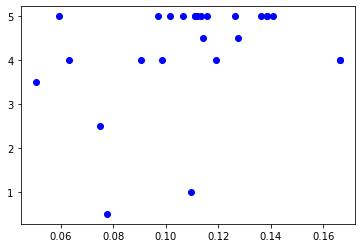

In [534]:
plt.scatter(resultss.reshape(-1,1), y, color = 'blue')

In [535]:
lin2.predict(poly.fit_transform(resultss.reshape(-1,1)))

array([4.26847447, 4.4962974 , 4.60728807, 4.66570421, 4.22758317,
       4.39114836, 4.3268906 , 3.63173856, 4.0289683 , 3.67847147,
       4.47877256, 4.31520738, 4.98699296, 3.5207479 , 4.98699296,
       4.28599931, 4.16916703, 4.29768254, 4.63649614, 4.29768254,
       3.83035343, 4.63649614, 4.28599931, 4.34441545, 3.86540311,
       4.12827574, 4.11075089])

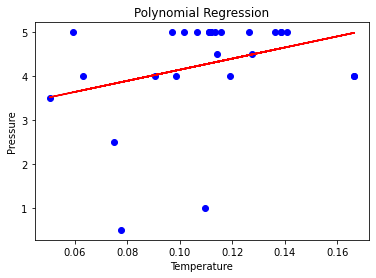

In [536]:
# Visualising the Polynomial Regression results
plt.scatter(resultss.reshape(-1,1), y, color = 'blue')
  
plt.plot(resultss.reshape(-1,1), lin2.predict(poly.fit_transform(resultss.reshape(-1,1))), color = 'red')
plt.title('Polynomial Regression')
plt.xlabel('Temperature')
plt.ylabel('Pressure')
  
plt.show()

In [455]:
ratings_enriched2 = ratings_enriched.copy()


KeyboardInterrupt



## Classifier - Popular2

In [412]:
df12 = df10.copy()

In [413]:
df12.head(5)

,level_0,index,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,...,vote_average,vote_count,movieId,imdbId,tmdbId,keywords,cast,crew,director,soup
0,0,0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[animation, comedy, family]",http://toystory.disney.com/toy-story,862,tt0114709,en,...,7.7,5415.0,1,114709,862,"[jealousy, toy, boy]","[tomhanks, timallen, donrickles]","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",johnlasseter,jealousy toy boy tomhanks timallen donrickles ...
1,1,1,False,NaN,65000000,"[adventure, fantasy, family]",NaN,8844,tt0113497,en,...,6.9,2413.0,2,113497,8844,"[boardgame, disappearance, basedonchildren'sbook]","[robinwilliams, jonathanhyde, kirstendunst]","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",joejohnston,boardgame disappearance basedonchildren'sbook ...
2,2,2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[romance, comedy]",NaN,15602,tt0113228,en,...,6.5,92.0,3,113228,15602,"[fishing, bestfriend, duringcreditsstinger]","[waltermatthau, jacklemmon, ann-margret]","[{'credit_id': '52fe466a9251416c75077a89', 'de...",howarddeutch,fishing bestfriend duringcreditsstinger walter...
3,3,3,False,NaN,16000000,"[comedy, drama, romance]",NaN,31357,tt0114885,en,...,6.1,34.0,4,114885,31357,"[basedonnovel, interracialrelationship, single...","[whitneyhouston, angelabassett, lorettadevine]","[{'credit_id': '52fe44779251416c91011acb', 'de...",forestwhitaker,basedonnovel interracialrelationship singlemot...
4,4,4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,[comedy],NaN,11862,tt0113041,en,...,5.7,173.0,5,113041,11862,"[baby, midlifecrisis, confidence]","[stevemartin, dianekeaton, martinshort]","[{'credit_id': '52fe44959251416c75039ed7', 'de...",charlesshyer,baby midlifecrisis confidence stevemartin dian...


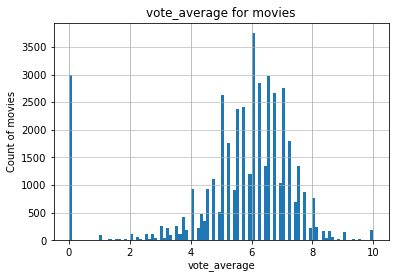

In [414]:
df12.vote_average.plot.hist(grid=True, bins=100)
plt.title('vote_average for movies')
plt.xlabel('vote_average')
plt.ylabel('Count of movies')
plt.grid(axis='y', alpha=0.75)

In [415]:
df12['popular_or_not'] = 0
df12.loc[df12['vote_average'] >= 7, 'popular_or_not'] = 1
df12.loc[:,['vote_average', 'popular_or_not']]

,vote_average,popular_or_not
0,7.7,1
1,6.9,0
2,6.5,0
3,6.1,0
4,5.7,0
5,7.7,1
6,6.2,0
7,5.4,0
8,5.5,0
9,6.6,0


In [441]:
df12['popular_or_not'].value_counts()

0    35811
1     9592
Name: popular_or_not, dtype: int64

In [442]:
35811/(35811+9592)

0.7887364271083409

In [416]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import pickle

%matplotlib inline

In [417]:
feature_names = ['budget']
feature_names.append('soup')
cols_to_scale = feature_names[0:-1]

In [418]:
X = df12[feature_names]
y = df12['popular_or_not']
X_train, X_test, y_train, y_test = train_test_split(X,y)
X_train.shape

(34052, 2)

In [419]:
df12[feature_names].isnull().sum()

budget    0
soup      0
dtype: int64

In [410]:
#df12.dropna(how='any', inplace = True)
#df12[feature_names].isnull().sum()

budget     0
revenue    0
soup       0
dtype: int64

In [420]:
#1 pipe per model per vectorizer
#1st combination: logreg + countvect
countvect = CountVectorizer()
ct = make_column_transformer(
    (countvect, 'soup'),
    (StandardScaler(), cols_to_scale),
    remainder = 'passthrough')
logreg = LogisticRegression(solver='liblinear')
pipe_logregcountvect = make_pipeline(ct, logreg)
pipe_logregcountvect.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('countvectorizer',
                                                  CountVectorizer(), 'soup'),
                                                 ('standardscaler',
                                                  StandardScaler(),
                                                  ['budget'])])),
                ('logisticregression', LogisticRegression(solver='liblinear'))])

In [422]:
pipe_logregcountvect.named_steps.keys() 

dict_keys(['columntransformer', 'logisticregression'])

In [429]:
stemmer = SnowballStemmer(language='english')
lemma = WordNetLemmatizer()
stops = set(stopwords.words('english'))

def stem_tokenize_removestop(document):
    tokens = word_tokenize(document)
    return [stemmer.stem(t) for t in tokens if t.isalpha() and t.lower() not in stops] 

def stem_tokenize_leavestop(document):
    tokens = word_tokenize(document)
    return [stemmer.stem(t) for t in tokens if t.isalpha()] 

def lemm_tokenize_removestop(document):
    tokens = word_tokenize(document)
    return [lemma.lemmatize(t) for t in tokens if t.isalpha() and t.lower() not in stops]

def lemm_tokenize_leavestop(document):
    tokens = word_tokenize(document)
    return [lemma.lemmatize(t) for t in tokens if t.isalpha()]

def tokenize_removestop(document):
    tokens = word_tokenize(document)
    return [t for t in tokens if t.isalpha() and t.lower() not in stops]

def tokenize_leavestop(document):
    tokens = word_tokenize(document)
    return [t for t in tokens if t.isalpha()]

In [430]:
pipe_logregcountvect_params = {}
pipe_logregcountvect_params['logisticregression__penalty'] = ['l1', 'l2']
pipe_logregcountvect_params['logisticregression__C'] = [0.1, 1, 10]
pipe_logregcountvect_params['columntransformer__countvectorizer__ngram_range'] = [(1, 1), (1, 2)]
pipe_logregcountvect_params['columntransformer__countvectorizer__tokenizer'] = [stem_tokenize_removestop, stem_tokenize_leavestop, lemm_tokenize_removestop, lemm_tokenize_leavestop, tokenize_removestop, tokenize_leavestop]

In [431]:
pipe_logregcountvect.named_steps.columntransformer.named_transformers_

{'countvectorizer': CountVectorizer(), 'standardscaler': StandardScaler()}

In [432]:
grid_logregcountvect_params = GridSearchCV(pipe_logregcountvect, pipe_logregcountvect_params, cv=5, scoring='accuracy')
grid_logregcountvect_params.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('countvectorizer',
                                                                         CountVectorizer(),
                                                                         'soup'),
                                                                        ('standardscaler',
                                                                         StandardScaler(),
                                                                         ['budget'])])),
                                       ('logisticregression',
                                        LogisticRegression(solver='liblinear'))]),
             param_grid={'columntransformer__countvectorizer__ngram_range': [(1,
                                                                          

In [433]:
results = pd.DataFrame(grid_logregcountvect_params.cv_results_)
results.sort_values('rank_test_score')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_columntransformer__countvectorizer__ngram_range,param_columntransformer__countvectorizer__tokenizer,param_logisticregression__C,param_logisticregression__penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
69,5.172204,0.237191,1.039841,0.060660,"(1, 2)",<function tokenize_leavestop at 0x000001A695F5...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790192,0.791073,0.793686,0.792364,0.791483,0.791760,0.001190,1
63,4.952975,0.068215,0.995512,0.019722,"(1, 2)",<function tokenize_removestop at 0x000001A695F...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790192,0.791073,0.793686,0.792364,0.791483,0.791760,0.001190,1
51,6.028273,0.239549,1.274629,0.137612,"(1, 2)",<function lemm_tokenize_removestop at 0x000001...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790486,0.790926,0.793539,0.791924,0.791777,0.791730,0.001049,3
57,6.300565,0.304472,1.286480,0.052677,"(1, 2)",<function lemm_tokenize_leavestop at 0x000001A...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790486,0.790926,0.793539,0.791924,0.791777,0.791730,0.001049,3
45,8.229662,0.336893,1.839411,0.069972,"(1, 2)",<function stem_tokenize_leavestop at 0x000001A...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790780,0.790633,0.792364,0.791483,0.790015,0.791055,0.000804,5
39,9.097519,0.602484,1.904864,0.119315,"(1, 2)",<function stem_tokenize_removestop at 0x000001...,1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.790780,0.790633,0.792364,0.791483,0.790015,0.791055,0.000804,5
67,5.032709,0.278735,1.072549,0.074623,"(1, 2)",<function tokenize_leavestop at 0x000001A695F5...,0.1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.789899,0.790339,0.790749,0.790896,0.789721,0.790321,0.000459,7
61,4.778590,0.099452,1.041157,0.029791,"(1, 2)",<function tokenize_removestop at 0x000001A695F...,0.1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.789899,0.790339,0.790749,0.790896,0.789721,0.790321,0.000459,7
37,8.336958,0.138375,1.933813,0.051401,"(1, 2)",<function stem_tokenize_removestop at 0x000001...,0.1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.789018,0.790486,0.791189,0.791043,0.789721,0.790291,0.000819,9
43,8.502732,0.289433,1.959350,0.171735,"(1, 2)",<function stem_tokenize_leavestop at 0x000001A...,0.1,l2,{'columntransformer__countvectorizer__ngram_ra...,0.789018,0.790486,0.791189,0.791043,0.789721,0.790291,0.000819,9


In [434]:
grid_logregcountvect_params.best_score_

0.7917597278825326

In [435]:
grid_logregcountvect_params.best_params_

{'columntransformer__countvectorizer__ngram_range': (1, 2),
 'columntransformer__countvectorizer__tokenizer': <function __main__.tokenize_removestop(document)>,
 'logisticregression__C': 1,
 'logisticregression__penalty': 'l2'}

In [436]:
from sklearn import metrics
confusion_logregcountvect = metrics.confusion_matrix(y_test, ypred_grid_logregcountvect_params)
TP = confusion_logregcountvect [1, 1]
TN = confusion_logregcountvect [0, 0]
FP = confusion_logregcountvect [0, 1]
FN = confusion_logregcountvect [1, 0]

#sensitivity
print(TP / float(TP + FN))

#specificity
print(TN / float(TN + FP))

#false positive rate
print(FP / float(TN + FP))

#precision
print(TP / float(TP + FP))

NameError: name 'ypred_grid_logregcountvect_params' is not defined

In [ ]:
fig, ax = plt.subplots()
sns.heatmap(confusion_matrix(y_test, ypred_grid_logregcountvect_params), annot=True, fmt='d', ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

In [ ]:
print(classification_report(y_test, ypred_grid_logregcountvect_params))

In [ ]:
#see how sensitivity and specificity are affected by various thresholds, without actually changing the threshold
#AUC is the percentage of the ROC plot that is underneath the curve
#AUC is useful as a single number summary of classifier performance.
#If you randomly chose one positive and one negative observation, AUC represents the likelihood that your classifier will assign a higher predicted probability to the positive observation.

y_pred_prob = grid_logregcountvect_params.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_prob)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.title('ROC curve for disaster tweets classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.grid(True)

# define a function that accepts a threshold and prints sensitivity and specificity
def evaluate_threshold(threshold):
    print('Sensitivity:', tpr[thresholds > threshold][-1])
    print('Specificity:', 1 - fpr[thresholds > threshold][-1])

evaluate_threshold(0.3)

In [ ]:
print(metrics.roc_auc_score(y_test, y_pred_prob))

## Ratings data

In [34]:
ratings = pd.read_csv('ratings.csv')
ratings.head()

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556


In [35]:
ratings.movieId = ratings.movieId.astype(int)
ratings.movieId = ratings.movieId.astype(str)
ratings.movieId

0             110
1             147
2             858
3            1221
4            1246
            ...  
26024284    58559
26024285    60069
26024286    63082
26024287    64957
26024288    71878
Name: movieId, Length: 26024289, dtype: object

In [36]:
#No users rated the same movie multiple times
ratings.loc[ratings.duplicated(subset=['userId','movieId'], keep=False),:]

,userId,movieId,rating,timestamp


In [37]:
moviesmetadata_links_keywords_credits.movieId = moviesmetadata_links_keywords_credits.movieId.astype(int)
moviesmetadata_links_keywords_credits.movieId = moviesmetadata_links_keywords_credits.movieId.astype(str)
moviesmetadata_links_keywords_credits

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,title,video,vote_average,vote_count,movieId,imdbId,tmdbId,keywords,cast,crew
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Toy Story,False,7.7,5415.0,1,114709,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Jumanji,False,6.9,2413.0,2,113497,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Grumpier Old Men,False,6.5,92.0,3,113228,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Waiting to Exhale,False,6.1,34.0,4,114885,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Father of the Bride Part II,False,5.7,173.0,5,113041,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45398,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,...,Subdue,False,4.0,1.0,176269,6209470,439050,"[{'id': 10703, 'name': 'tragic love'}]","[{'cast_id': 0, 'character': '', 'credit_id': ...","[{'credit_id': '5894a97d925141426c00818c', 'de..."
45399,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,...,Century of Birthing,False,9.0,3.0,176271,2028550,111109,"[{'id': 2679, 'name': 'artist'}, {'id': 14531,...","[{'cast_id': 1002, 'character': 'Sister Angela...","[{'credit_id': '52fe4af1c3a36847f81e9b15', 'de..."
45400,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",...,Betrayal,False,3.8,6.0,176273,303758,67758,[],"[{'cast_id': 6, 'character': 'Emily Shaw', 'cr...","[{'credit_id': '52fe4776c3a368484e0c8387', 'de..."
45401,False,NaN,0,[],NaN,227506,tt0008536,en,Satana likuyushchiy,"In a small town live two brothers, one a minis...",...,Satan Triumphant,False,0.0,0.0,176275,8536,227506,[],"[{'cast_id': 2, 'character': '', 'credit_id': ...","[{'credit_id': '533bccebc3a36844cf0011a7', 'de..."


In [38]:
ratings_enriched = pd.merge(ratings, moviesmetadata_links_keywords_credits, left_on='movieId', right_on='movieId')
ratings_enriched

,userId,movieId,rating,timestamp,adult,belongs_to_collection,budget,genres,homepage,id,...,tagline,title,video,vote_average,vote_count,imdbId,tmdbId,keywords,cast,crew
0,1,110,1.0,1425941529,False,NaN,72000000,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,197,...,Every man dies. Not every man truly lives.,Braveheart,False,7.7,3404.0,112573,197,"[{'id': 30, 'name': 'individual'}, {'id': 388,...","[{'cast_id': 5, 'character': 'William Wallace'...","[{'credit_id': '52fe4225c3a36847f80079c1', 'de..."
1,11,110,3.5,1231676989,False,NaN,72000000,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,197,...,Every man dies. Not every man truly lives.,Braveheart,False,7.7,3404.0,112573,197,"[{'id': 30, 'name': 'individual'}, {'id': 388,...","[{'cast_id': 5, 'character': 'William Wallace'...","[{'credit_id': '52fe4225c3a36847f80079c1', 'de..."
2,22,110,5.0,1111937009,False,NaN,72000000,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,197,...,Every man dies. Not every man truly lives.,Braveheart,False,7.7,3404.0,112573,197,"[{'id': 30, 'name': 'individual'}, {'id': 388,...","[{'cast_id': 5, 'character': 'William Wallace'...","[{'credit_id': '52fe4225c3a36847f80079c1', 'de..."
3,24,110,5.0,979870012,False,NaN,72000000,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,197,...,Every man dies. Not every man truly lives.,Braveheart,False,7.7,3404.0,112573,197,"[{'id': 30, 'name': 'individual'}, {'id': 388,...","[{'cast_id': 5, 'character': 'William Wallace'...","[{'credit_id': '52fe4225c3a36847f80079c1', 'de..."
4,29,110,3.0,1044020005,False,NaN,72000000,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,197,...,Every man dies. Not every man truly lives.,Braveheart,False,7.7,3404.0,112573,197,"[{'id': 30, 'name': 'individual'}, {'id': 388,...","[{'cast_id': 5, 'character': 'William Wallace'...","[{'credit_id': '52fe4225c3a36847f80079c1', 'de..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25972120,270887,159050,5.0,1472697413,False,NaN,0,[],NaN,126076,...,NaN,The Pilot's Wife,False,0.0,0.0,289390,126076,[],"[{'cast_id': 1, 'character': 'Kathryn Lyons', ...",[]
25972121,270887,159053,5.0,1486961830,False,NaN,1000000,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...",NaN,56491,...,Behind Enemy Lines No Man Can Stop Her. Only O...,In Her Line of Fire,False,3.3,9.0,487156,56491,"[{'id': 526, 'name': 'rebel'}, {'id': 840, 'na...","[{'cast_id': 2, 'character': 'Sergeant Major L...","[{'credit_id': '52fe4902c3a36847f8184ed1', 'de..."
25972122,270887,165649,4.0,1479088587,False,NaN,1500000,"[{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...",NaN,302042,...,NaN,Dead on Campus,False,4.7,14.0,3731196,302042,"[{'id': 3616, 'name': 'college'}, {'id': 10058...","[{'cast_id': 0, 'character': 'Natalie Kellison...","[{'credit_id': '5461740bc3a3686f2e000e7d', 'de..."
25972123,270887,171051,4.0,1493084042,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 53, 'name...",NaN,23476,...,NaN,Without Evidence,False,4.7,7.0,176326,23476,[],"[{'cast_id': 1, 'character': 'Kevin Francke', ...","[{'credit_id': '52fe446ac3a368484e021c59', 'de..."


In [39]:
#import os
#path = 'D:\- Python Files'
#ratings_enriched.to_csv(os.path.join(path, "ratings_enriched.csv"))

#ratings_enriched2 = pd.read_csv('ratings_enriched.csv')
#ratings_enriched2